GAN Basics, pix2pix, U-NET, eccv paper

## Basics of Statistical Classification

2 types of models involved, **a generative model and a discriminative model**

* The generative model tries to find the joint probability P(X,Y) or P(X) when there are no labels where X is the set of data instances and Y is the set of labels. Then the joint probability can be used to find P(Y|X) or P(X|Y).
* The discriminative model tries to find the conditional probability P(Y|X) directly.

Discriminative models try to draw boundaries in the data space, while generative models try to model how data is placed throughout the space. For example, the following diagram shows discriminative and generative models of handwritten digits:

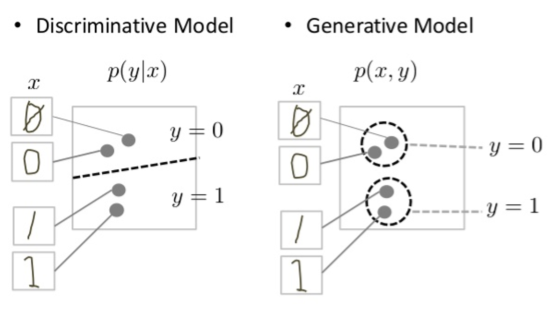


## Basic Working of GANs

Both the generator and the discriminator are neural networks. The generator output is connected directly to the discriminator input. Through backpropagation, the discriminator's classification provides a signal that the generator uses to update its weights.

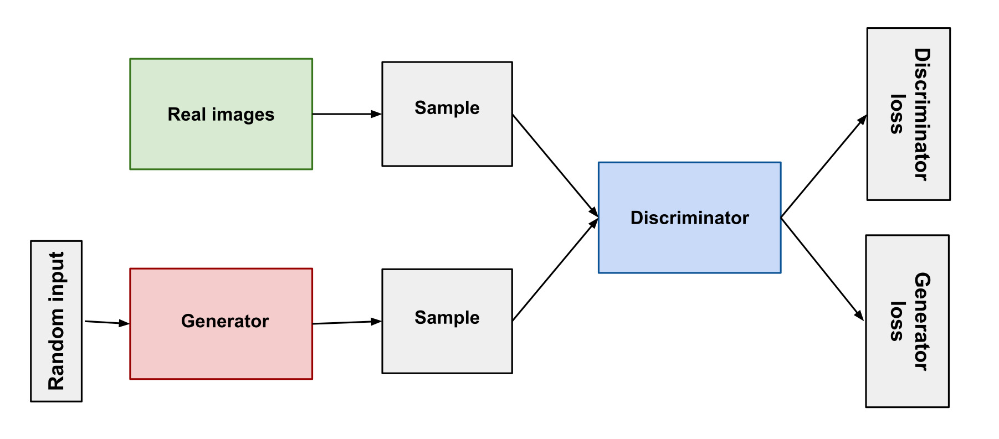

## The Discriminator

The discriminator in a GAN is simply a classifier. It tries to distinguish real data from the data created by the generator. It could use any network architecture appropriate to the type of data it's classifying. 

### Training process for the Discriminator

* The Training data for the discriminator include Real data (positive examples) and Fake data (negative examples generated by the generator). 

* During discriminator training the generator does not train. Its weights remain constant while it produces examples for the discriminator to train on. The discriminator connects to two loss functions. During discriminator training, the discriminator ignores the generator loss and just uses the discriminator loss.

1. The discriminator classifies both real data and fake data from the generator.
2. The discriminator loss penalizes the discriminator for misclassifying a real instance as fake or a fake instance as real.
3. The discriminator updates its weights through backpropagation from the discriminator loss through the discriminator network.

## The Generator

The generator part of a GAN learns to create fake data by incorporating feedback from the discriminator. It learns to make the discriminator classify its output as real.

The generator training includes:
* Random input noise to the generator.
* The generator network that generates the new data instances.
* The discriminator network the classifies the generator output.
* The generator loss that penalizes the generator for failing to fool the generator.


The Steps involved are:
1. Sample Random Noise 
2. Produce generaator output from the sampled random noise
3. Get the discriminator classification for the generator output
4. Calculate loss from discriminator output.
5. Backpropogate through both discriminator and generator and obtain the gradients, only updating the generator weights.

## GAN Training

The GAN has to juggle the training of 2 networks and the convergence is hard to identify.

The training proceeds in the following manner:
1. The discriminator trains for one or more epochs
2. The generator trains for one or more epochs
3. Repeat steps 1 and 2

While one network is training, the weights of the other stay constant. Talking about the **convergence**, as the generator improves with training, the discriminator performance gets worse because the discriminator can't easily tell the difference between real and fake. This progression poses a problem for convergence of the GAN as a whole: the discriminator feedback gets less meaningful over time. **For a GAN, convergence is often a fleeting, rather than stable, state.**

## Loss Functions

GANs try to replicate a probability distribution. They should therefore use loss functions that reflect the distance between the distribution of the data generated by the GAN and the distribution of the real data.

### Minimax Loss

In the paper that introduced GANs, the generator tries to minimize the following function while the discriminator tries to maximize it:

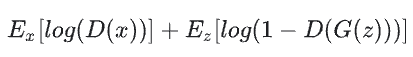

In this function:

* D(x) is the discriminator's estimate of the probability that real data instance x is real.
* Ex is the expected value over all real data instances.
* G(z) is the generator's output when given noise z.
* D(G(z)) is the discriminator's estimate of the probability that a fake instance is real.
* Ez is the expected value over all random inputs to the generator (in effect, the expected value over all generated fake instances G(z)).

The generator can't directly influence the first term, so it effectively minimizes the second term only. The original GAN paper notes that the above minimax loss function can cause the GAN to get stuck in the early stages of GAN training when the discriminator's job is very easy. The paper therefore suggests modifying the generator loss so that the generator tries to maximize log D(G(z)). (**Modified Minimax Loss**)

There are other loss functions too like the **Wasserstein Loss**.

In [1]:
class Config:
    external_data_size = 10000
    train_size = 8000
    image_size_1 = 256
    image_size_2 = 256
    batch_size = 32
    LeakyReLU_slope = 0.2
    dropout = 0.5
    kernel_size = 4
    stride = 2
    padding = 1
    gen_lr = 2e-4
    disc_lr = 2e-4
    beta1 = 0.5
    beta2 = 0.999
    lambda_l1 = 100
    gan_mode = 'vanilla'
    layers_to_cut = -2
    epochs = 20
    pretrain_lr = 1e-4

In [2]:
!pip install --upgrade torch torchvision

import os
from pathlib import Path
import glob
import time
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from tqdm import tqdm

from PIL import Image
from skimage.color import rgb2lab, lab2rgb

import torch
from torch import nn, optim
from torchvision import transforms
from torchvision.models.resnet import resnet18
from torchvision.models.vgg import vgg19
from torch.utils.data import Dataset, DataLoader
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 776.3/776.3 MB 1.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.1/19.1 MB 33.5 MB/s eta 0:00:00
  Attempting uninstall: torch
    Found existing installation: torch 1.11.0
    Uninstalling torch-1.11.0:
      Successfully uninstalled torch-1.11.0
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.12.0
    Uninstalling torchvision-0.12.0:
      Successfully uninstalled torchvision-0.12.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
allennlp 2.10.0 requires protobuf==3.20.0, but you have protobuf 3.19.4 which is incompatible.
allennlp 2.10.0 requires torch<1.12.0,>=1.10.0, but you have torch 1.12.1 which is incompatible.
allennlp 2.10.0 requires torchvision<0.13.0,>=0.8.1, but you have torchvision 0.13.1 which is incompatible.


In [3]:
!pip install fastai==2.4
from fastai.vision.learner import create_body
from fastai.vision.models.unet import DynamicUnet
from fastai.data.external import untar_data, URLs

path = untar_data(URLs.COCO_SAMPLE)
path = str(path) + "/train_sample"
paths = glob.glob(path + "/*.jpg")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 187.9/187.9 kB 1.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 831.4/831.4 MB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.0/56.0 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.1/19.1 MB 28.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.0/21.0 MB 31.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.2/23.2 MB 26.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.3/23.3 MB 27.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.3/23.3 MB 27.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.1/22.1 MB 32.1 MB/s eta 0:00:00
  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.3.0
    Uninstalling typing_extensions-4.3.0:
      Successfully uninstalled typing_extensions-4.3.0
  Attempting uninstall: torch
    Found existing installation: torch 1.12.1


In [4]:
np.random.seed(42)
paths_subset = np.random.choice(paths, Config.external_data_size, replace=False) # choosing 20000 images randomly
random_idxs = np.random.permutation(Config.external_data_size)
train_idxs = random_idxs[:Config.train_size] # choosing the first 18000 as training set
val_idxs = random_idxs[Config.train_size:] # choosing last 2000 as validation set
train_paths = paths_subset[train_idxs]
val_paths = paths_subset[val_idxs]
print(len(train_paths), len(val_paths))

8000 2000


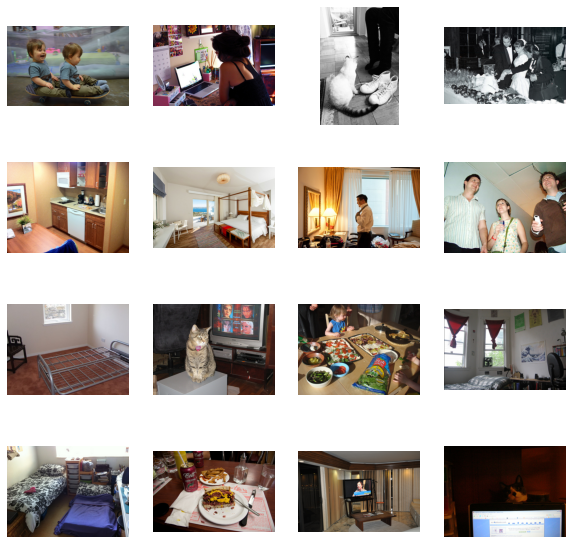

In [5]:
_, axes = plt.subplots(4, 4, figsize=(10, 10))
for ax, img_path in zip(axes.flatten(), train_paths):
    ax.imshow(Image.open(img_path))
    ax.axis("off")

In [6]:
class ImageDataset(Dataset):
    ''' 
    
    Class that deals with the Data Loading and preprocessing steps 
    
    '''
    
    def __init__(self,paths,train = True):
        if train == True:
            self.transforms = transforms.Compose([transforms.Resize((Config.image_size_1,Config.image_size_2)),
                                                 transforms.RandomHorizontalFlip()])
        elif train == False:
            self.transforms = transforms.Compose([transforms.Resize((Config.image_size_1,Config.image_size_2))])
            
        self.train = train
        self.paths = paths
        
    def __len__(self):
        return len(self.paths)
    
    def __getitem__(self,idx):
        img = Image.open(self.paths[idx]).convert("RGB")
        img = self.transforms(img)
        img = np.array(img)
        lab = rgb2lab(img).astype("float32")
        lab = transforms.ToTensor()(lab)
        L = lab[[0],...]/50 - 1 # Standardizing L space
        ab = lab[[1,2],...]/110 # Standardizing ab space
        
        return {'L': L,
                'ab': ab}

In [7]:
batch_size = Config.batch_size

#train dataset
train_data = ImageDataset(paths = train_paths, train=True)
# validation dataset
valid_data = ImageDataset(paths = val_paths, train=False)
# train data loader
train_loader = DataLoader(train_data, batch_size=batch_size,shuffle=True,pin_memory = True)
# validation data loader
valid_loader = DataLoader(valid_data, batch_size=batch_size,shuffle=False,pin_memory = True)

## Util Functions

Credits: https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix

In [8]:
class AverageMeter:
    def __init__(self):
        self.reset()
        
    def reset(self):
        self.count, self.avg, self.sum = [0.] * 3
    
    def update(self, val, count=1):
        self.count += count
        self.sum += count * val
        self.avg = self.sum / self.count

def create_loss_meters():
    disc_loss_gen = AverageMeter()
    disc_loss_real = AverageMeter()
    disc_loss = AverageMeter()
    loss_G_GAN = AverageMeter()
    loss_G_L1 = AverageMeter()
    loss_G = AverageMeter()
    
    return {'disc_loss_gen': disc_loss_gen,
            'disc_loss_real': disc_loss_real,
            'disc_loss': disc_loss,
            'loss_G_GAN': loss_G_GAN,
            'loss_G_L1': loss_G_L1,
            'loss_G': loss_G}

def update_losses(model, loss_meter_dict, count):
    for loss_name, loss_meter in loss_meter_dict.items():
        loss = getattr(model, loss_name)
        loss_meter.update(loss.item(), count=count)

def lab_to_rgb(L, ab):
    """
    
    Takes a batch of images and converts from LAB space to RGB
    
    """
    
    L = (L + 1.) * 50.
    ab = ab * 110.
    Lab = torch.cat([L, ab], dim=1).permute(0, 2, 3, 1).cpu().numpy()
    rgb_imgs = []
    for img in Lab:
        img_rgb = lab2rgb(img)
        rgb_imgs.append(img_rgb)
    return np.stack(rgb_imgs, axis=0)
    
def visualize(model, data, save=True):
    model.generator.eval()
    with torch.no_grad():
        model.prepare_input(data)
        model.forward()
    model.generator.train()
    fake_color = model.gen_output.detach()
    real_color = model.ab
    L = model.L
    fake_imgs = lab_to_rgb(L, fake_color)
    real_imgs = lab_to_rgb(L, real_color)
    fig = plt.figure(figsize=(15, 8))
    for i in range(5):
        ax = plt.subplot(3, 5, i + 1)
        ax.imshow(L[i][0].cpu(), cmap='gray')
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 5)
        ax.imshow(fake_imgs[i])
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 10)
        ax.imshow(real_imgs[i])
        ax.axis("off")
    plt.show()
    if save:
        fig.savefig(f"colorization_{time.time()}.png")
        
def log_results(loss_meter_dict):
    for loss_name, loss_meter in loss_meter_dict.items():
        print(f"{loss_name}: {loss_meter.avg:.5f}")

## GAN loss
class GANLoss(nn.Module):
    def __init__(self, gan_mode='vanilla', real_label=1.0, fake_label=0.0):
        super().__init__()
        self.register_buffer('real_label', torch.tensor(real_label))
        self.register_buffer('fake_label', torch.tensor(fake_label))
        if gan_mode == 'vanilla':
            self.loss = nn.BCEWithLogitsLoss()
        elif gan_mode == 'lsgan':
            self.loss = nn.MSELoss()
    
    def get_labels(self, preds, target_is_real):
        if target_is_real:
            labels = self.real_label
        else:
            labels = self.fake_label
        return labels.expand_as(preds)
    
    def __call__(self, preds, target_is_real):
        labels = self.get_labels(preds, target_is_real)
        loss = self.loss(preds, labels)
        return loss

## The Generator

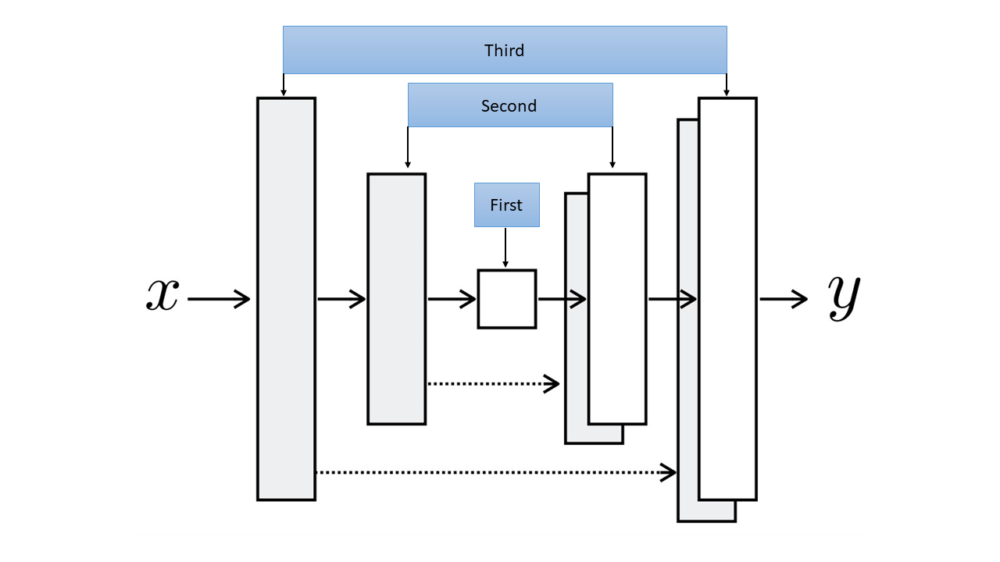

In [9]:
# Code help for model architecture and training loop: https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix

class UnetBlock(nn.Module):
    def __init__(self, nf, ni, submodule=None, input_channels=None, dropout=False,innermost=False, outermost=False):
        super().__init__()
        self.outermost = outermost
        if input_channels is None: 
            input_channels = nf
        downconv = nn.Conv2d(input_channels, ni, kernel_size=Config.kernel_size, stride=Config.stride, padding=Config.padding, bias=False)
        downrelu = nn.LeakyReLU(Config.LeakyReLU_slope, True)
        downnorm = nn.BatchNorm2d(ni)
        uprelu = nn.ReLU(True)
        upnorm = nn.BatchNorm2d(nf)
        
        if outermost:
            upconv = nn.ConvTranspose2d(ni * 2, nf,kernel_size=Config.kernel_size, stride=Config.stride, padding=Config.padding)
            down = [downconv]
            up = [uprelu, upconv, nn.Tanh()]
            model = down + [submodule] + up
        elif innermost:
            upconv = nn.ConvTranspose2d(ni, nf, kernel_size=Config.kernel_size, stride=Config.stride, padding=Config.padding, bias=False)
            down = [downrelu, downconv]
            up = [uprelu, upconv, upnorm]
            model = down + up
        else:
            upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=Config.kernel_size, stride=Config.stride, padding=Config.padding, bias=False)
            down = [downrelu, downconv, downnorm]
            up = [uprelu, upconv, upnorm]
            if dropout: up += [nn.Dropout(Config.dropout)]
            model = down + [submodule] + up
        self.model = nn.Sequential(*model)
    
    def forward(self, x):
        if self.outermost:
            return self.model(x)
        else:
            return torch.cat([x, self.model(x)], 1)

class Unet(nn.Module):
    def __init__(self, input_channels=1, output_channels=2, n_down=8, num_filters=64):
        super().__init__()
        unet_block = UnetBlock(num_filters * 8, num_filters * 8, innermost=True)
        for _ in range(n_down - 5):
            unet_block = UnetBlock(num_filters * 8, num_filters * 8, submodule=unet_block, dropout=True)
        out_filters = num_filters * 8
        for _ in range(3):
            unet_block = UnetBlock(out_filters // 2, out_filters, submodule=unet_block)
            out_filters //= 2
        self.model = UnetBlock(output_channels, out_filters, input_channels=input_channels, submodule=unet_block, outermost=True)
    
    def forward(self, x):
        return self.model(x)

## The Discriminator

The discriminator being used here is working on small patches of the images instead of the image as a whole

In [10]:
class Discriminator(nn.Module):
    
    def __init__(self,input_channels,num_filters=64, n_down=3):
        super().__init__()
        model = [self.get_layers(input_channels,num_filters,norm = False)]
        model += [self.get_layers(num_filters * 2 ** i, num_filters * 2 ** (i + 1), stride=1 if i == (n_down-1) else 2) for i in range(n_down)]
        model += [self.get_layers(num_filters * 2 ** n_down, 1, stride=1, norm=False, activation=False)] 
        self.model = nn.Sequential(*model)
    
    def get_layers(self, ni, nf, kernel_size=Config.kernel_size, stride=Config.stride, padding=Config.padding, norm=True, activation=True): 
        layers = [nn.Conv2d(ni, nf, kernel_size, stride, padding, bias=not norm)]          
        if norm: 
            layers += [nn.BatchNorm2d(nf)]
        if activation:
            layers += [nn.LeakyReLU(Config.LeakyReLU_slope, True)]
        return nn.Sequential(*layers)
    
    def forward(self, x):
        return self.model(x)

### Normal Weight Initialization with mean = 0, std = 0.02

In [11]:
# def init_model(model,device,gain=0.02):
#     model = model.to(device)
#     classname = model.__class__.__name__
#     if hasattr(model, 'weight') and 'Conv' in classname:
#         nn.init.normal_(model.weight.data, mean=0.0, std=gain)
#         return model

In [12]:
def init_weights(net, init='norm', gain=0.02):
    
    def init_func(m):
        classname = m.__class__.__name__
        if hasattr(m, 'weight') and 'Conv' in classname:
            if init == 'norm':
                nn.init.normal_(m.weight.data, mean=0.0, std=gain)
            elif init == 'xavier':
                nn.init.xavier_normal_(m.weight.data, gain=gain)
            elif init == 'kaiming':
                nn.init.kaiming_normal_(m.weight.data, a=0, mode='fan_in')
            
            if hasattr(m, 'bias') and m.bias is not None:
                nn.init.constant_(m.bias.data, 0.0)
        elif 'BatchNorm2d' in classname:
            nn.init.normal_(m.weight.data, 1., gain)
            nn.init.constant_(m.bias.data, 0.)
            
    net.apply(init_func)
    print(f"model initialized with {init} initialization")
    return net

def init_model(model, device):
    model = model.to(device)
    model = init_weights(model)
    return model

## Main Model

In [13]:
def build_backbone_unet(input_channels=1, output_channels=2, size=Config.image_size_1):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    body = create_body(resnet18, pretrained=True, n_in=input_channels, cut=Config.layers_to_cut)
    generator = DynamicUnet(body, output_channels, (size, size)).to(device)
    return generator

def pretrain_generator(generator, train_dl, opt, criterion, epochs):
    for e in range(epochs):
        loss_meter = AverageMeter()
        for data in tqdm(train_dl):
            L, ab = data['L'].to(device), data['ab'].to(device)
            preds = generator(L)
            loss = criterion(preds, ab)
            opt.zero_grad()
            loss.backward()
            opt.step()
            
            loss_meter.update(loss.item(), L.size(0))
            
        print(f"Epoch {e + 1}/{epochs}")
        print(f"L1 Loss: {loss_meter.avg:.5f}")

In [14]:
class MainModel(nn.Module):
    
    def __init__(self,generator = None,gen_lr =Config.gen_lr,disc_lr = Config.disc_lr, beta1 = Config.beta1,beta2 = Config.beta2, lambda_l1 = Config.lambda_l1):
        super().__init__()
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.lambda_l1 = lambda_l1
        
        if generator is None:
            self.generator = init_model(Unet(input_channels=1, output_channels=2, n_down=8, num_filters=64),self.device)
        else:
            self.generator = generator.to(self.device)
        self.discriminator = init_model(Discriminator(input_channels = 3,num_filters = 64,n_down = 3),self.device)
        self.GANloss = GANLoss(gan_mode=Config.gan_mode).to(self.device)
        self.L1loss = nn.L1Loss()
        self.gen_optim = optim.Adam(self.generator.parameters(), lr=gen_lr, betas=(beta1, beta2))
        self.disc_optim= optim.Adam(self.discriminator.parameters(), lr=disc_lr, betas=(beta1, beta2))
        
    def requires_grad(self,model,requires_grad = True):
        for p in model.parameters():
            p.requires_grad = requires_grad
            
    def prepare_input(self,data):
        self.L = data['L'].to(self.device)
        self.ab = data['ab'].to(self.device)
        
    def forward(self):
        self.gen_output = self.generator(self.L)
        
    def disc_backward(self):
        gen_image = torch.cat([self.L, self.gen_output], dim=1)
        gen_image_preds = self.discriminator(gen_image.detach())
        self.disc_loss_gen = self.GANloss(gen_image_preds, False)
        real_image = torch.cat([self.L, self.ab], dim=1)
        real_preds = self.discriminator(real_image)
        self.disc_loss_real = self.GANloss(real_preds, True)
        self.disc_loss = (self.disc_loss_gen + self.disc_loss_real) * 0.5
        self.disc_loss.backward()
    
    def gen_backward(self):
        gen_image = torch.cat([self.L, self.gen_output], dim=1)
        gen_image_preds = self.discriminator(gen_image)
        self.loss_G_GAN = self.GANloss(gen_image_preds, True)
        self.loss_G_L1 = self.L1loss(self.gen_output, self.ab) * self.lambda_l1
        self.loss_G = self.loss_G_GAN + self.loss_G_L1
        self.loss_G.backward()
    
    def optimize(self):
        self.forward()
        self.discriminator.train()
        self.requires_grad(self.discriminator, True)
        self.disc_optim.zero_grad()
        self.disc_backward()
        self.disc_optim.step()
        
        self.generator.train()
        self.requires_grad(self.discriminator, False) # Damn
        self.gen_optim.zero_grad()
        self.gen_backward()
        self.gen_optim.step()

## Training Function

In [15]:
def train_model(model, train_loader, epochs, display=200):
    data = next(iter(train_loader)) 
    for epoch in range(epochs):
        loss_meter_dict = create_loss_meters() 
        i=0
        for data in tqdm(train_loader):
            model.prepare_input(data) 
            model.optimize()
            update_losses(model, loss_meter_dict, count=data['L'].size(0)) 
            i+=1
            if i % display == 0:
                print(f"\nEpoch {epoch+1}/{epochs}")
                print(f"Iteration {i}/{len(train_loader)}")
                log_results(loss_meter_dict) 
                visualize(model, data, save=False) 

# model = MainModel()
# train_model(model, train_loader, Config.epochs)

/opt/conda/lib/python3.7/site-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
/opt/conda/lib/python3.7/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

100%|██████████| 250/250 [05:42<00:00,  1.37s/it]


Epoch 1/20
L1 Loss: 0.08691


100%|██████████| 250/250 [05:37<00:00,  1.35s/it]


Epoch 2/20
L1 Loss: 0.08266


100%|██████████| 250/250 [05:38<00:00,  1.36s/it]


Epoch 3/20
L1 Loss: 0.08184


100%|██████████| 250/250 [05:38<00:00,  1.36s/it]


Epoch 4/20
L1 Loss: 0.08129


100%|██████████| 250/250 [05:39<00:00,  1.36s/it]


Epoch 5/20
L1 Loss: 0.08075


100%|██████████| 250/250 [05:37<00:00,  1.35s/it]


Epoch 6/20
L1 Loss: 0.08010


100%|██████████| 250/250 [05:39<00:00,  1.36s/it]


Epoch 7/20
L1 Loss: 0.07964


100%|██████████| 250/250 [05:38<00:00,  1.35s/it]


Epoch 8/20
L1 Loss: 0.07887


100%|██████████| 250/250 [05:39<00:00,  1.36s/it]


Epoch 9/20
L1 Loss: 0.07811


100%|██████████| 250/250 [05:39<00:00,  1.36s/it]


Epoch 10/20
L1 Loss: 0.07757


100%|██████████| 250/250 [05:39<00:00,  1.36s/it]


Epoch 11/20
L1 Loss: 0.07653


100%|██████████| 250/250 [05:39<00:00,  1.36s/it]


Epoch 12/20
L1 Loss: 0.07563


100%|██████████| 250/250 [05:42<00:00,  1.37s/it]


Epoch 13/20
L1 Loss: 0.07441


100%|██████████| 250/250 [05:41<00:00,  1.36s/it]


Epoch 14/20
L1 Loss: 0.07317


100%|██████████| 250/250 [05:42<00:00,  1.37s/it]


Epoch 15/20
L1 Loss: 0.07190


100%|██████████| 250/250 [05:41<00:00,  1.36s/it]


Epoch 16/20
L1 Loss: 0.07030


100%|██████████| 250/250 [05:41<00:00,  1.36s/it]


Epoch 17/20
L1 Loss: 0.06873


100%|██████████| 250/250 [05:41<00:00,  1.37s/it]


Epoch 18/20
L1 Loss: 0.06774


100%|██████████| 250/250 [05:39<00:00,  1.36s/it]


Epoch 19/20
L1 Loss: 0.06681


100%|██████████| 250/250 [05:38<00:00,  1.35s/it]


Epoch 20/20
L1 Loss: 0.06550
model initialized with norm initialization


  0%|          | 0/250 [00:00<?, ?it/s]/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: Defining your `__torch_function__` as a plain method is deprecated and will be an error in future, please define it as a classmethod. (Triggered internally at  ../torch/csrc/utils/python_arg_parser.cpp:296.)
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: Defining your `__torch_function__` as a plain method is deprecated and will be an error in future, please define it as a classmethod. (Triggered internally at  ../torch/csrc/utils/python_arg_parser.cpp:296.)
/opt/conda/lib/python3.7/site-packages/torch/nn/modules/conv.py:454: UserWarning: Defining your `__torch_function__` as a plain method is deprecated and will be an error in future, please define it as a classmethod. (Triggered internally at  ../torch/csrc/utils/python_arg_parser.cpp:296.)
  \sum_{k = 0}^{C_{in} - 1} weight(C_{out_j}, k) \star input(N_i, k)
/opt/conda/lib/python3.7/site-


Epoch 1/20
Iteration 200/250
disc_loss_gen: 0.62940
disc_loss_real: 0.63182
disc_loss: 0.63061
loss_G_GAN: 1.02275
loss_G_L1: 7.83351
loss_G: 8.85626


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: Defining your `__torch_function__` as a plain method is deprecated and will be an error in future, please define it as a classmethod. (Triggered internally at  ../torch/csrc/utils/python_arg_parser.cpp:296.)
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:41: UserWarning: Defining your `__torch_function__` as a plain method is deprecated and will be an error in future, please define it as a classmethod. (Triggered internally at  ../torch/csrc/utils/python_arg_parser.cpp:296.)
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:42: UserWarning: Defining your `__torch_function__` as a plain method is deprecated and will be an error in future, please define it as a classmethod. (Triggered internally at  ../torch/csrc/utils/python_arg_parser.cpp:296.)


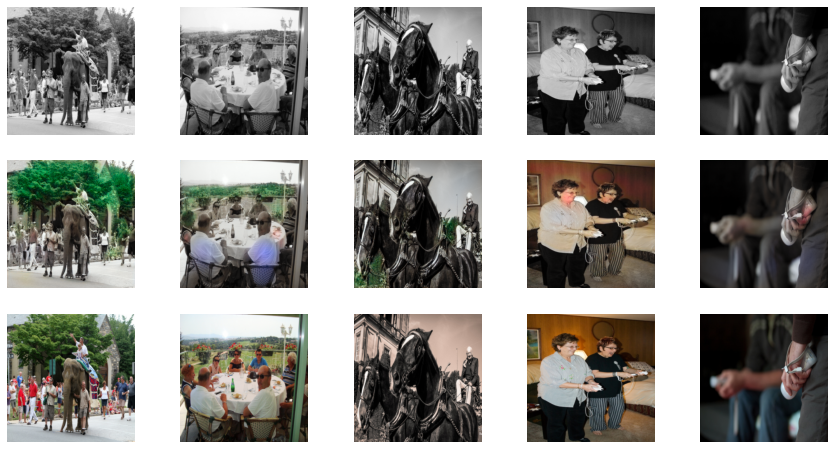

 80%|███████▉  | 199/250 [05:14<01:19,  1.55s/it]


Epoch 2/20
Iteration 200/250
disc_loss_gen: 0.61204
disc_loss_real: 0.58789
disc_loss: 0.59996
loss_G_GAN: 1.10138
loss_G_L1: 7.91913
loss_G: 9.02051


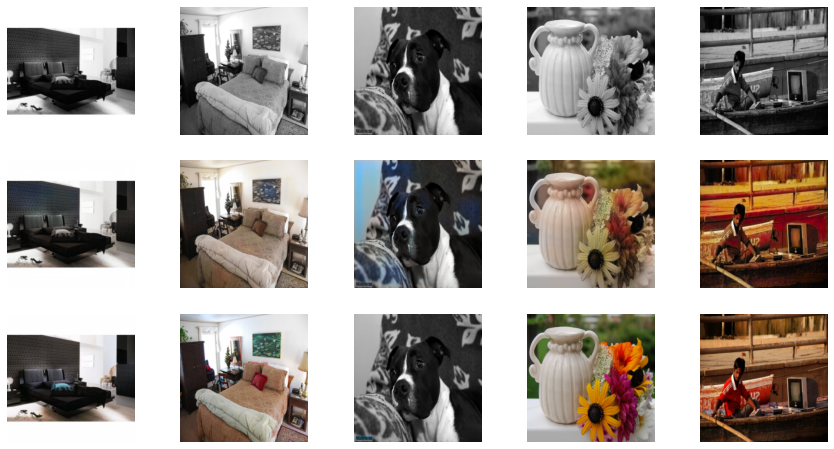

 80%|███████▉  | 199/250 [05:16<01:21,  1.59s/it]


Epoch 3/20
Iteration 200/250
disc_loss_gen: 0.60971
disc_loss_real: 0.61224
disc_loss: 0.61098
loss_G_GAN: 1.04059
loss_G_L1: 7.78589
loss_G: 8.82648


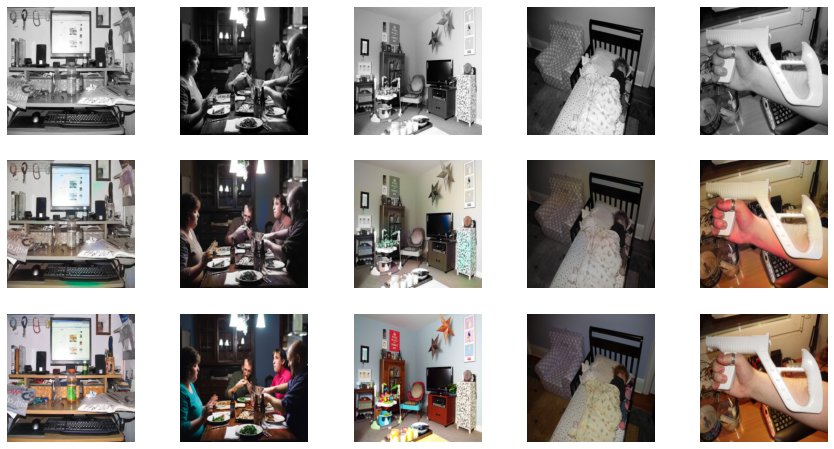

 80%|███████▉  | 199/250 [05:15<01:21,  1.59s/it]


Epoch 4/20
Iteration 200/250
disc_loss_gen: 0.60712
disc_loss_real: 0.61560
disc_loss: 0.61136
loss_G_GAN: 1.01434
loss_G_L1: 7.73230
loss_G: 8.74663


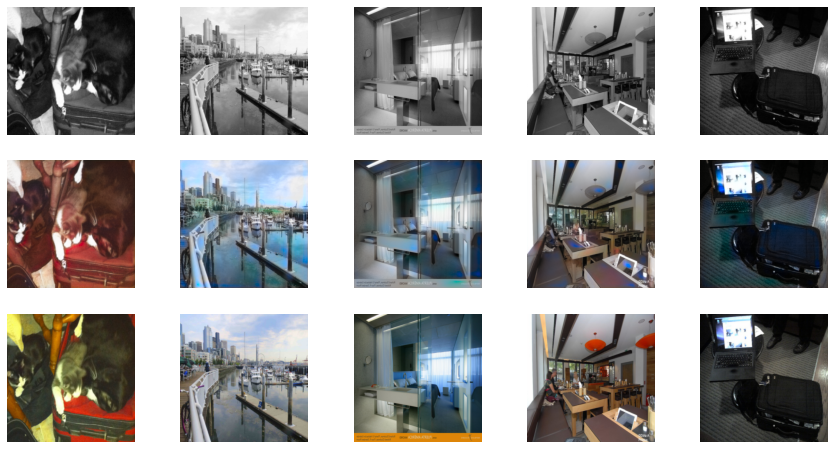

 80%|███████▉  | 199/250 [05:15<01:20,  1.57s/it]


Epoch 5/20
Iteration 200/250
disc_loss_gen: 0.61397
disc_loss_real: 0.61296
disc_loss: 0.61347
loss_G_GAN: 1.00756
loss_G_L1: 7.61814
loss_G: 8.62570


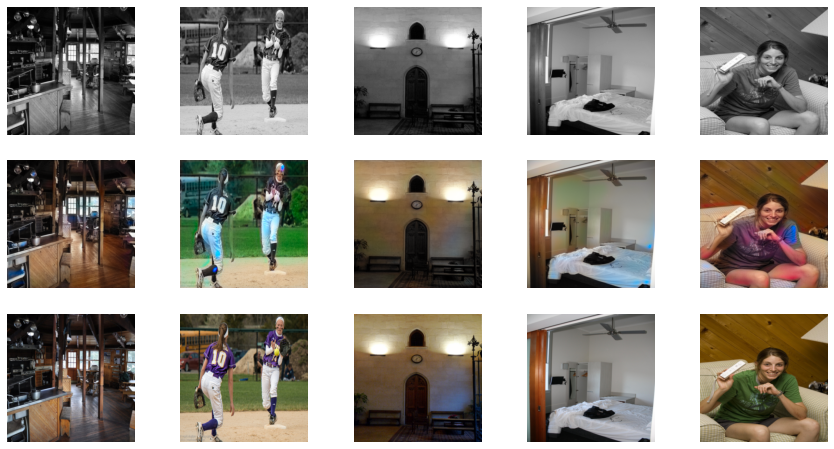

 80%|███████▉  | 199/250 [05:14<01:20,  1.59s/it]


Epoch 6/20
Iteration 200/250
disc_loss_gen: 0.61342
disc_loss_real: 0.62884
disc_loss: 0.62113
loss_G_GAN: 0.99005
loss_G_L1: 7.49664
loss_G: 8.48669


/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 90 pixels
  return func(*args, **kwargs)
/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 19 pixels
  return func(*args, **kwargs)
/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 35 pixels
  return func(*args, **kwargs)
/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 573 pixels
  return func(*args, **kwargs)
/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 33 pixels
  return func(*args, **kwargs)
/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 2 pixels
  return func(*args, **kwargs)
/opt/conda/lib/python3.7/site-packages/skimage/_shared/uti

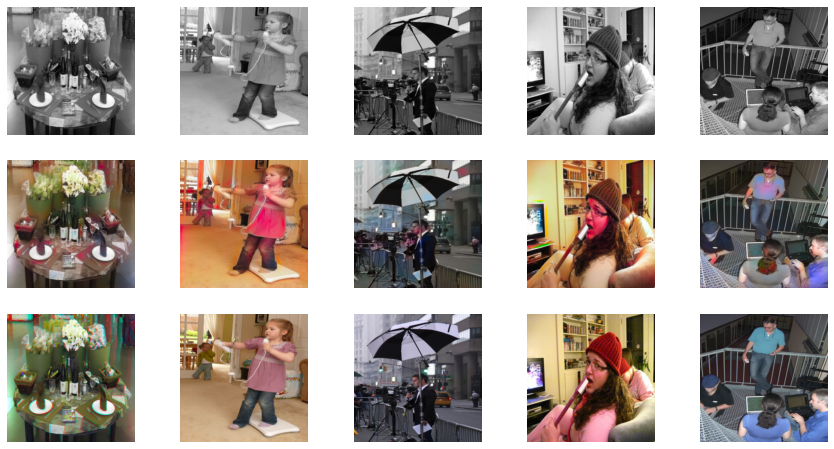

 80%|███████▉  | 199/250 [05:16<01:20,  1.57s/it]


Epoch 7/20
Iteration 200/250
disc_loss_gen: 0.60591
disc_loss_real: 0.61876
disc_loss: 0.61233
loss_G_GAN: 0.98213
loss_G_L1: 7.40084
loss_G: 8.38298


/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 7 pixels
  return func(*args, **kwargs)
/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 28 pixels
  return func(*args, **kwargs)
/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 1 pixels
  return func(*args, **kwargs)


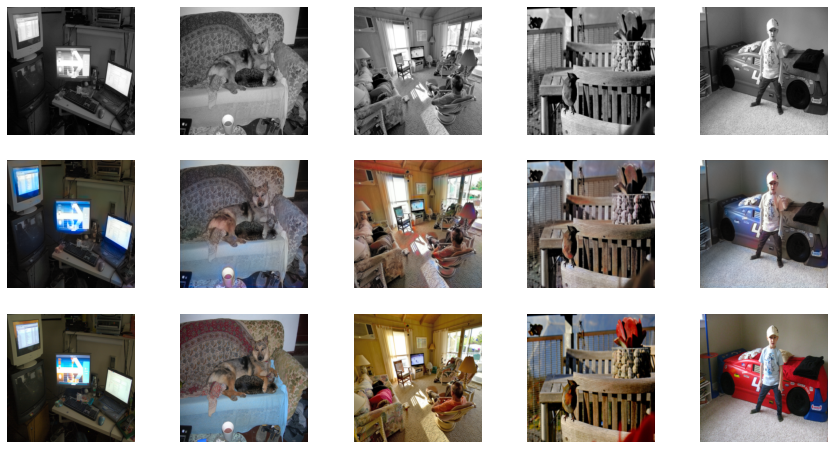

 80%|███████▉  | 199/250 [05:15<01:19,  1.56s/it]


Epoch 8/20
Iteration 200/250
disc_loss_gen: 0.61734
disc_loss_real: 0.62693
disc_loss: 0.62213
loss_G_GAN: 0.96679
loss_G_L1: 7.25267
loss_G: 8.21946


/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 5 pixels
  return func(*args, **kwargs)
/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 6 pixels
  return func(*args, **kwargs)
/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 3 pixels
  return func(*args, **kwargs)
/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 13 pixels
  return func(*args, **kwargs)


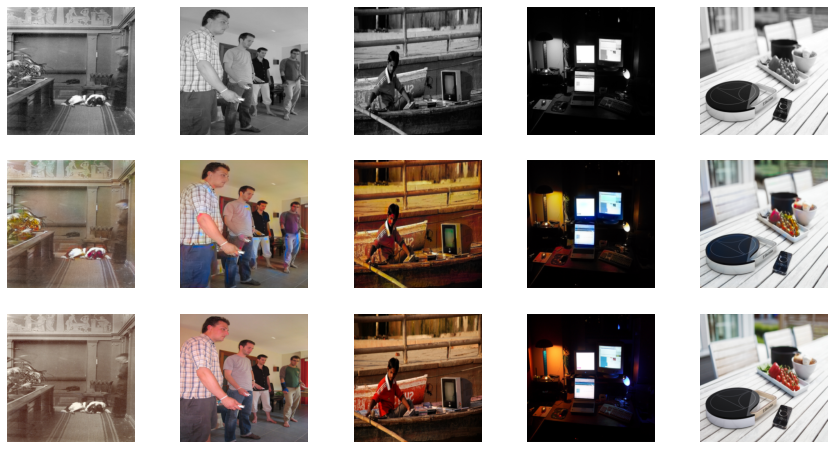

 80%|███████▉  | 199/250 [05:14<01:20,  1.57s/it]


Epoch 9/20
Iteration 200/250
disc_loss_gen: 0.62318
disc_loss_real: 0.63422
disc_loss: 0.62870
loss_G_GAN: 0.95063
loss_G_L1: 7.24497
loss_G: 8.19559


/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 21 pixels
  return func(*args, **kwargs)
/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 4 pixels
  return func(*args, **kwargs)


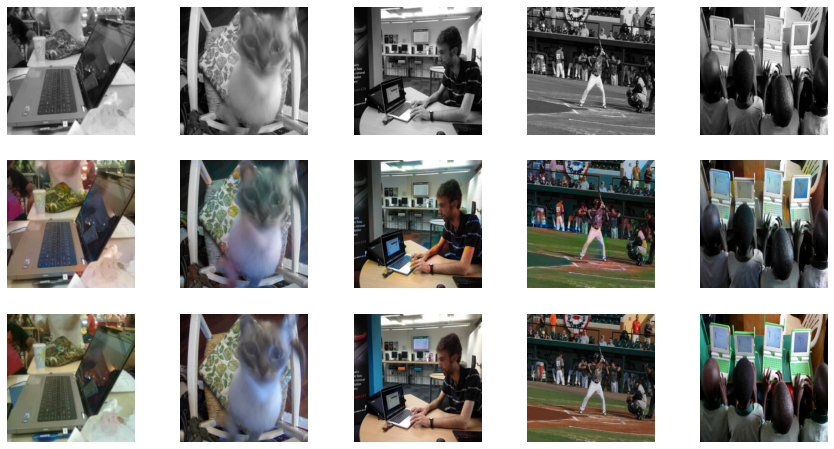

 80%|███████▉  | 199/250 [05:15<01:22,  1.61s/it]


Epoch 10/20
Iteration 200/250
disc_loss_gen: 0.62915
disc_loss_real: 0.63227
disc_loss: 0.63071
loss_G_GAN: 0.92458
loss_G_L1: 7.09080
loss_G: 8.01539


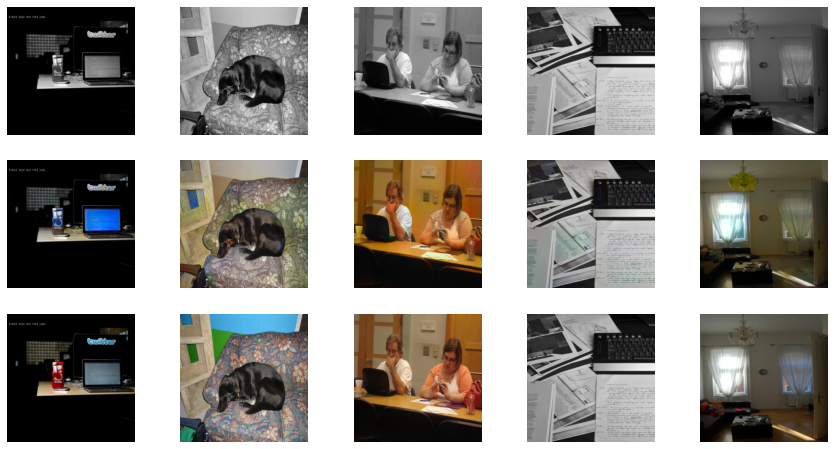

 80%|███████▉  | 199/250 [05:16<01:19,  1.56s/it]


Epoch 11/20
Iteration 200/250
disc_loss_gen: 0.63252
disc_loss_real: 0.64345
disc_loss: 0.63798
loss_G_GAN: 0.90216
loss_G_L1: 6.92720
loss_G: 7.82937


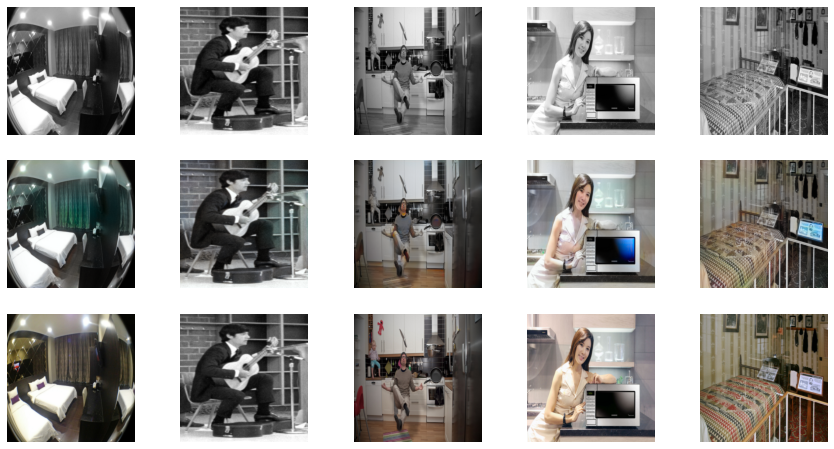

 80%|███████▉  | 199/250 [05:16<01:21,  1.60s/it]


Epoch 12/20
Iteration 200/250
disc_loss_gen: 0.63863
disc_loss_real: 0.64551
disc_loss: 0.64207
loss_G_GAN: 0.88819
loss_G_L1: 6.82820
loss_G: 7.71639


/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 10 pixels
  return func(*args, **kwargs)


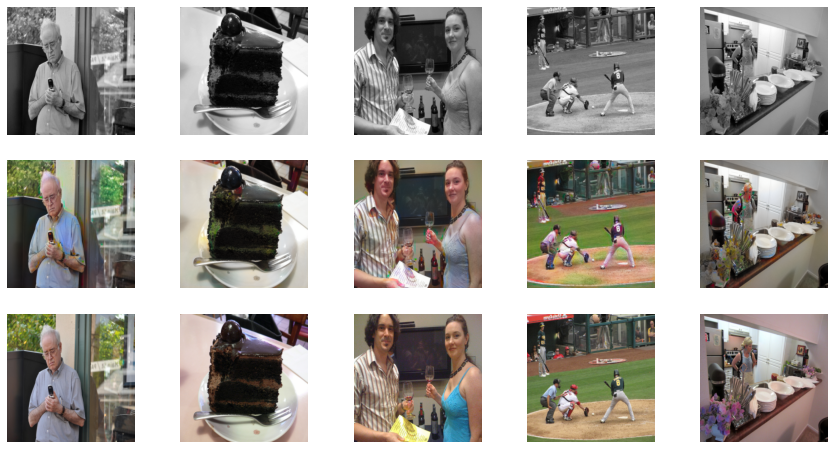

 80%|███████▉  | 199/250 [05:15<01:19,  1.56s/it]


Epoch 13/20
Iteration 200/250
disc_loss_gen: 0.63851
disc_loss_real: 0.64746
disc_loss: 0.64298
loss_G_GAN: 0.88732
loss_G_L1: 6.65520
loss_G: 7.54251


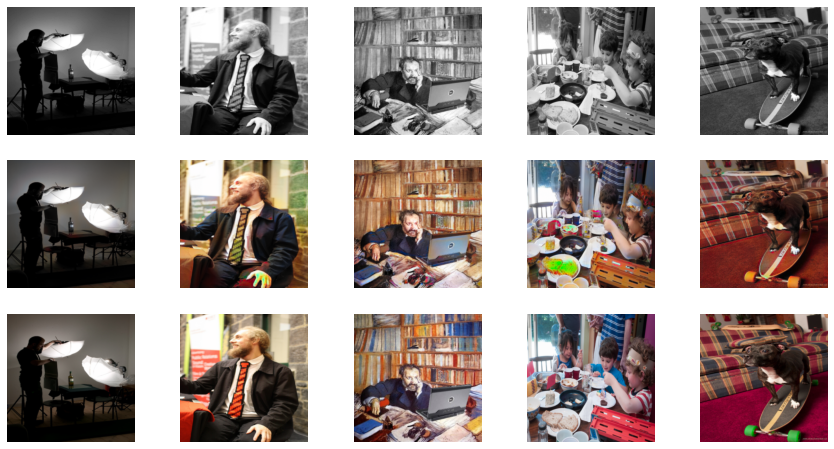

 80%|███████▉  | 199/250 [05:16<01:21,  1.59s/it]


Epoch 14/20
Iteration 200/250
disc_loss_gen: 0.63904
disc_loss_real: 0.64583
disc_loss: 0.64244
loss_G_GAN: 0.88646
loss_G_L1: 6.57270
loss_G: 7.45917


/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 18 pixels
  return func(*args, **kwargs)
/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 12 pixels
  return func(*args, **kwargs)
/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 20 pixels
  return func(*args, **kwargs)


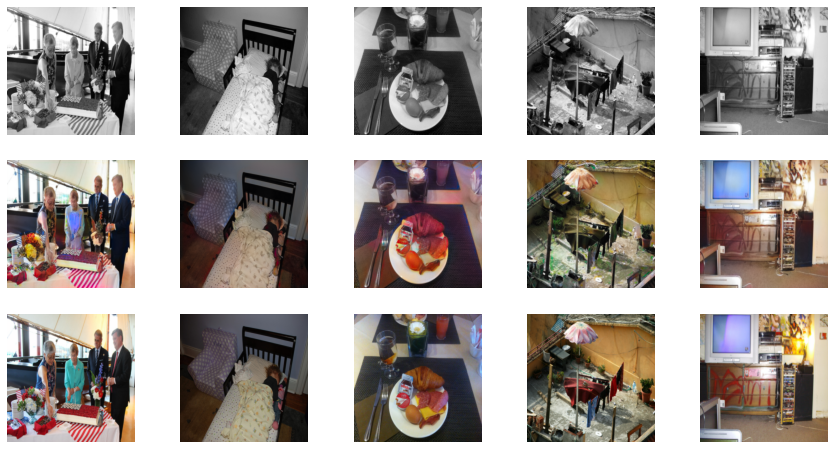

 80%|███████▉  | 199/250 [05:17<01:19,  1.55s/it]


Epoch 15/20
Iteration 200/250
disc_loss_gen: 0.64051
disc_loss_real: 0.65173
disc_loss: 0.64612
loss_G_GAN: 0.87227
loss_G_L1: 6.46411
loss_G: 7.33638


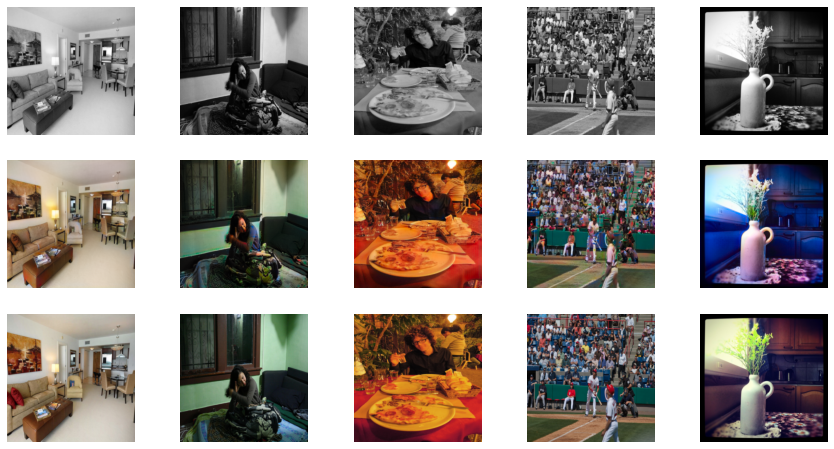

 80%|███████▉  | 199/250 [05:15<01:19,  1.56s/it]


Epoch 16/20
Iteration 200/250
disc_loss_gen: 0.64755
disc_loss_real: 0.64483
disc_loss: 0.64619
loss_G_GAN: 0.86844
loss_G_L1: 6.29252
loss_G: 7.16096


/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 8 pixels
  return func(*args, **kwargs)
/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 9 pixels
  return func(*args, **kwargs)


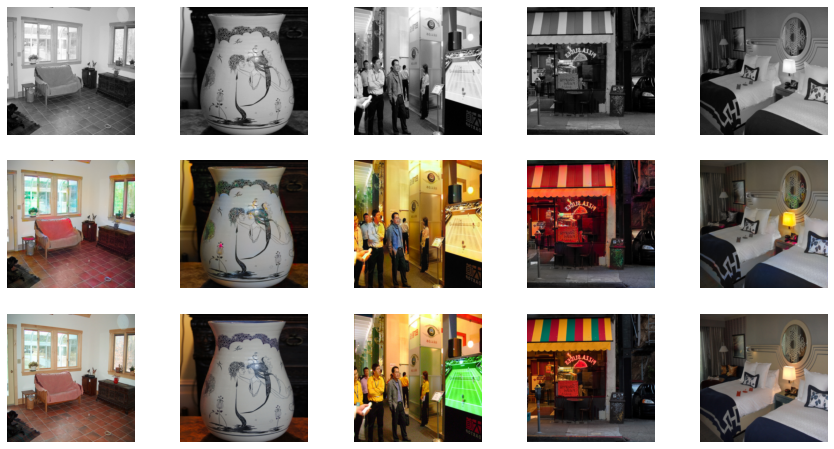

 80%|███████▉  | 199/250 [05:17<01:20,  1.59s/it]


Epoch 17/20
Iteration 200/250
disc_loss_gen: 0.63764
disc_loss_real: 0.65007
disc_loss: 0.64386
loss_G_GAN: 0.86349
loss_G_L1: 6.18463
loss_G: 7.04812


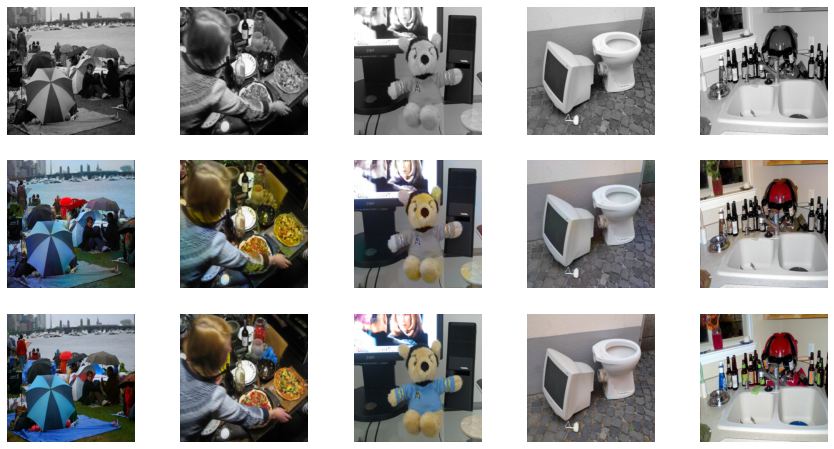

 80%|███████▉  | 199/250 [05:15<01:18,  1.55s/it]


Epoch 18/20
Iteration 200/250
disc_loss_gen: 0.64822
disc_loss_real: 0.65021
disc_loss: 0.64922
loss_G_GAN: 0.85632
loss_G_L1: 6.07035
loss_G: 6.92667


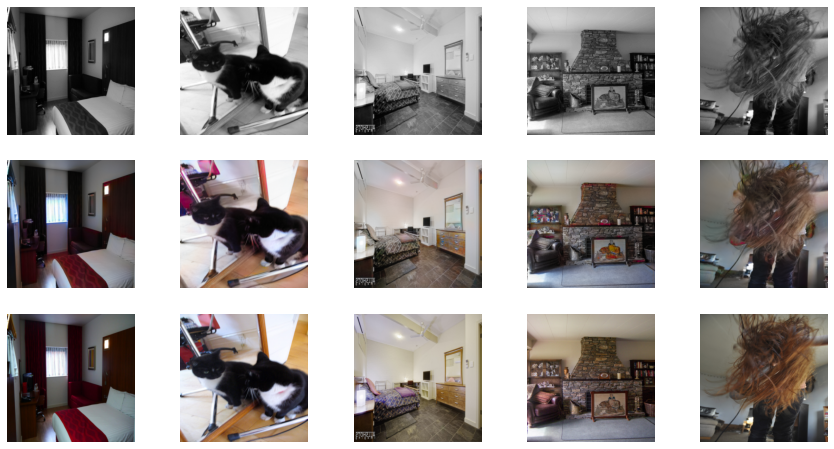

 80%|███████▉  | 199/250 [05:15<01:24,  1.66s/it]


Epoch 19/20
Iteration 200/250
disc_loss_gen: 0.64469
disc_loss_real: 0.65207
disc_loss: 0.64838
loss_G_GAN: 0.84676
loss_G_L1: 5.92391
loss_G: 6.77067


/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 45 pixels
  return func(*args, **kwargs)


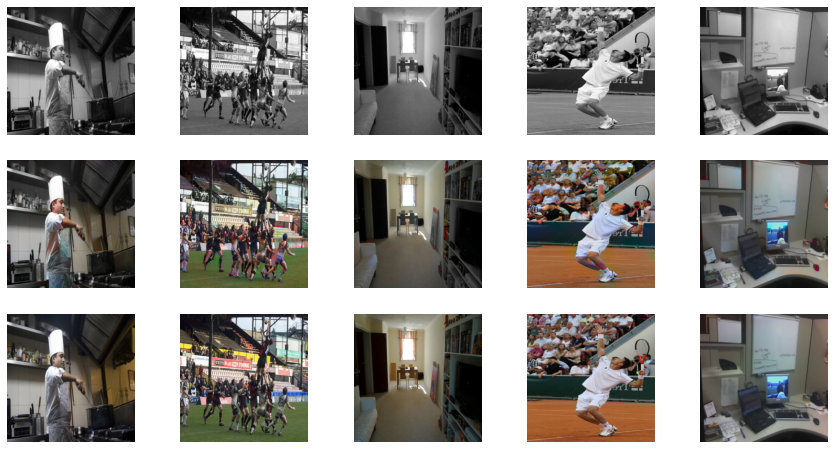

 80%|███████▉  | 199/250 [05:17<01:18,  1.54s/it]


Epoch 20/20
Iteration 200/250
disc_loss_gen: 0.64845
disc_loss_real: 0.66139
disc_loss: 0.65492
loss_G_GAN: 0.85315
loss_G_L1: 5.79308
loss_G: 6.64624


/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 91 pixels
  return func(*args, **kwargs)


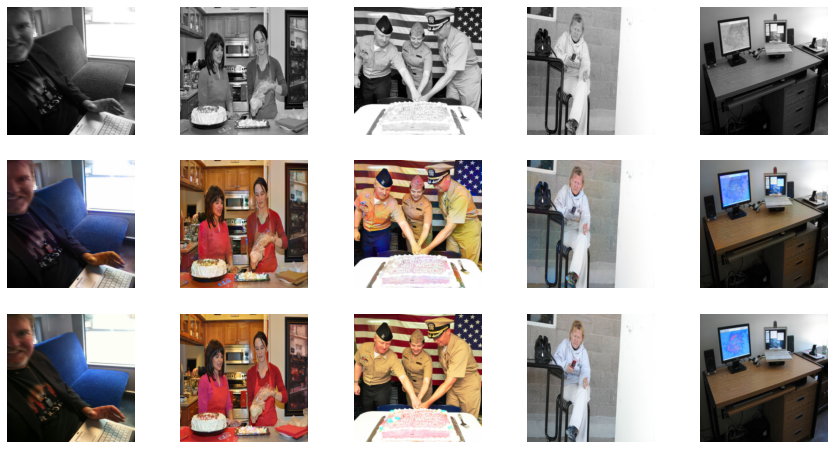

100%|██████████| 250/250 [06:41<00:00,  1.61s/it]


In [16]:
generator = build_backbone_unet(input_channels=1, output_channels=2, size=Config.image_size_1)
opt = optim.Adam(generator.parameters(), lr=Config.pretrain_lr)
loss = nn.L1Loss()        
pretrain_generator(generator, train_loader, opt, loss, Config.epochs)
torch.save(generator.state_dict(), "res18-unet.pt")
generator.load_state_dict(torch.load("/kaggle/working/res18-unet.pt", map_location=device))
model = MainModel(generator=generator)
train_model(model, train_loader, Config.epochs)